# COMP47700 Speech and Audio PL2: Audio Processing in Python


## Learning Outcomes
The aim of this tutorial is to build on the basic audio processing in Python from lab sheet 1 and to continue to familiarise yourself with the libraries and concepts introduced in the lectures.

This practical tutorial covers the following learning outcomes within the COMP47700 Speech and Audio module:
* Analyse speech and audio signals and features **[LO1]**
  * Develop the ability to handle audio data in Python, including importing, manipulating, and managing various audio formats

* Create programmes to conduct experiments on speech and audio samples building on third-party software libraries **[LO6]**
  * Attain proficiency in generating sound in Python, exploring techniques and tools to create custom audio signals for diverse applications.
  * Master the visualization of audio data in different domains, including time (Waveform), frequency (Spectrum), and time-frequency (Spectrogram/STFT), utilizing Python tools like librosa, scipy, and numpy for effective frequency domain visualization.


## Module Topics
* Basic audio processing (Unit 2, Unit 3)

## Why Is It Important?
Mastering fundamental audio processing techniques is essential for seamlessly grasping advanced concepts covered later in this module. Whenever you manipulate or generate audio, visualization and normalization in both the time and frequency domains become indispensable. Processing audio using libraries like librosa or scipy is imperative. Proficiency in these fundamental concepts in Python is critical for effectively addressing advanced audio topics such as audio quality, degradation, machine learning pipelines, and is essential for success in the module project.

## Structure of this tutorial
This practical tutorial contains different sections:
* **Live coding:** Basic theory, demos and coding examples presented by the lecturer on site (unmarked)
* **Student activity:** Familiarisation and coding exercises to be completed by the students and followed by a short discussion on site (unmarked). These activities introduce key concepts and skills necessary to complete the assignments.
* **Assignment:** Three (3) take home problem/coding questions to be completed by the students and due in two (2) weeks from the day the practical tutorial is given. Assignment questions represent fifteen (15) mark points.

>[COMP47700 Speech and Audio PL2: Audio Processing in Python](#scrollTo=oIY9p4hcjGr4)

>>[Learning Outcomes](#scrollTo=IvNfIDiAInTf)

>>[Module Topics](#scrollTo=IvNfIDiAInTf)

>>[Why Is It Important?](#scrollTo=IvNfIDiAInTf)

>>[Structure of this tutorial](#scrollTo=IvNfIDiAInTf)

>[DTMF frequency grid](#scrollTo=eh_V8MseInTi)

>>[Live Coding: Sine wave generation](#scrollTo=xL9BQTMeInTk)

>>[Student Activity: Sine wave generation and mixing](#scrollTo=UmJ1wBuGInTl)

>>[Live Coding: Fast Fourier Transform (FFT)](#scrollTo=jG33XS82InTn)

>>[Student Activity: Mystery DTMF Number](#scrollTo=q2S-0PB-InTo)

>[Assignment](#scrollTo=agC5K-cDInTq)

>>>[Question 1](#scrollTo=vnH6AR45rQnG)

>>>[Question 2](#scrollTo=V45Wxc-0qfKi)

>>>[Question 3](#scrollTo=Tg7HnV2Lo3JR)



# DTMF frequency grid

[Dual-tone multi-frequency signaling (DTMF)](https://en.wikipedia.org/wiki/Dual-tone_multi-frequency_signaling) was used to send information signals over the voice frequency bands on a telephone system. This means that both voice and dual tones are sent over the same channel.
While it is no longer in general use, you still hear it for some automatic information systems (e.g. telephone banking or service centres). These simple signals are interesting for introducing audio processing concepts.

The 4x4 matrix shows the frequencies to combine to create the sound for each key, e.g. to create the tone for a 4, a 770 Hz tone is combined with a 1209 Hz tone.

|        | 1209 Hz | 1336 Hz | 1477 Hz | 1633 Hz |
|--------|---------|---------|---------|---------|
| 697 Hz | 1       | 2       | 3       | A       |
| 770 Hz | 4       | 5       | 6       | B       |
| 852 Hz | 7       | 8       | 9       | C       |
| 941 Hz | *       | 0       | #       | D       |

Sine wave signals were used in the number dialling on touch-tone phones. They use a dual-tone multi-frequency DTMF system to encode the number dialled for transmission across the telephone network as an auditory signal. DTMF is also used in automated telephone service menu systems.


Each key-press on the telephone keypad generates the sum of two tones expressed as

\begin{equation}
x(n)=cos(2\pi f_{1} nT) + cos(2\pi f_{2} nT)
\end{equation}

where $T$ is the sampling period  and the two frequencies $f_{1}$ and $f_{2}$ combine together to give a unique encoding for each digit on the keypad. The frequencies used are shown in the table above.


### Downloading and extracting lab zip file from Github

In [193]:
# Download the zip file
!wget https://github.com/COMP47700-Speech-and-Audio/PL2-Audio-Processing-in-Python/raw/main/PL2_files.zip

--2025-02-07 17:37:44--  https://github.com/COMP47700-Speech-and-Audio/PL2-Audio-Processing-in-Python/raw/main/PL2_files.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/COMP47700-Speech-and-Audio/PL2-Audio-Processing-in-Python/main/PL2_files.zip [following]
--2025-02-07 17:37:45--  https://raw.githubusercontent.com/COMP47700-Speech-and-Audio/PL2-Audio-Processing-in-Python/main/PL2_files.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5426604 (5.2M) [application/zip]
Saving to: ‘PL2_files.zip.1’

PL2_files.zip.1     100%[===================>]   5.17M  --.-KB/s    in 0.09s   

2025-02-07 1

In [194]:
import zipfile

zipname = 'PL2_files.zip'
# Extract the zip file
with zipfile.ZipFile(zipname, 'r') as zip_ref:
    zip_ref.extractall()  # Extract all files to the current directory

In [195]:
#Imports and Magic
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import urllib.request as urllib2
%matplotlib inline

## **Live Coding**: Sine wave generation

1. With a sampling frequency of 16 kHz, create a sin wave with a 770 Hz frequency and 0.25 amplitude.
2. Plot the 0.02 seconds of the wave and play it.

16000


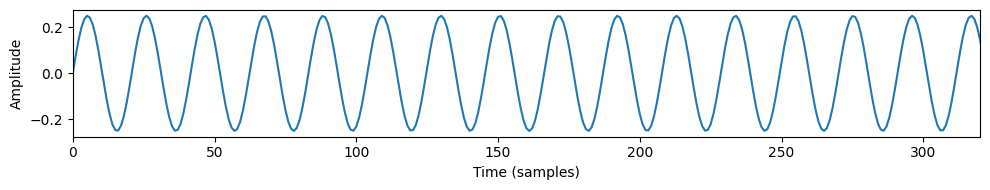

In [196]:
# Sampling frequency
sr = 16000

# Amplitude
A = 0.25

# Frequency (Hertz)
f = 770

# Angular frequency (Radians)
w = 2*np.pi*f

# Duration of the signal (secs) - The signal needs to have a finite duration!
T = 1

# Time samples
t = np.arange(0, T, 1/sr)

# Create sine wave
s1 = A * np.sin(w*t)

# Plot signal
plt.figure(figsize=(10,2))
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Play signal
ipd.Audio(s1, rate=sr)
print(s1.size)

## **Student Activity**: Sine wave generation and mixing
1. Create a second signal but this time with a frequency of 1209 Hz.
2. Add it to your first signal and plot and play the 3 waves: sine wave 770 Hz, sine wave 1209 Hz, and the sum.

**Question:** What number have you generated?

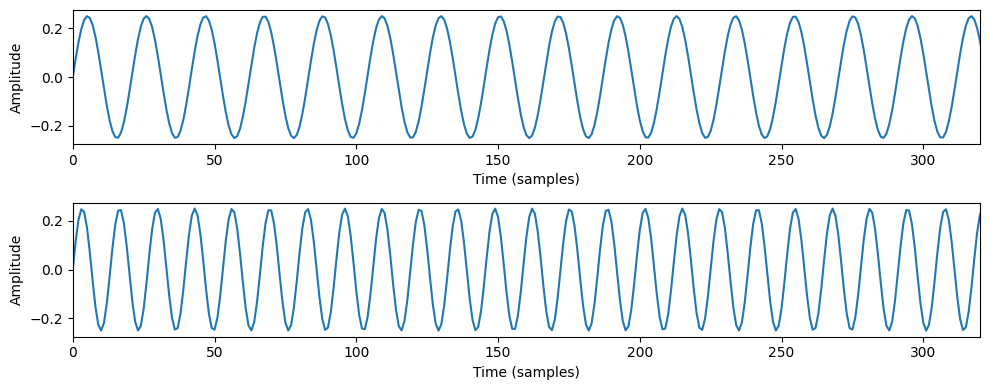

In [197]:
# Amplitude
A = 0.25

# Frequency
f = 1209

# Frequency in Radians
w = 2*np.pi*f

# Create sine wave
s2 = A*np.sin(w*t)

# Plot
plt.figure(figsize=(10,4))

# Subplot 1
plt.subplot(2,1,1)
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 2
plt.subplot(2,1,2)
plt.plot(s2)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Player
ipd.Audio(s2, rate=sr)

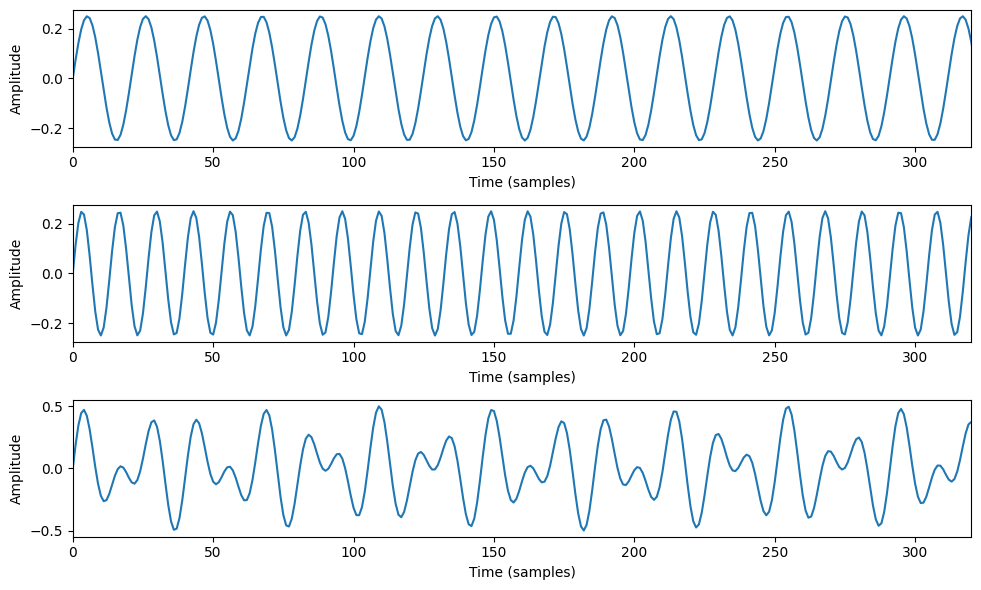

In [198]:
# Mix sine waves (create key press tone)
s_mix=s1+s2

# Plot mixed signal
plt.figure(figsize=(10,6))

# Subplot 1 (s1)
plt.subplot(3,1,1)
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 2 (s2)
plt.subplot(3,1,2)
plt.plot(s2)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 3 (s_mix)
plt.subplot(3,1,3)
plt.plot(s_mix)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()

# Play all signals
ipd.display(ipd.Audio(s1, rate=sr))
ipd.display(ipd.Audio(s2, rate=sr))
ipd.display(ipd.Audio(s_mix, rate=sr))

## **Live Coding**: Fast Fourier Transform (FFT)

Computing a FFT to look at the signal in the frequency domain and see what tones are in the signal.

There are lots of ways of doing this, e.g.: `numpy.fft.rfft`, `scipy.fftpack.fftfreq`, `librosa.piptrack`


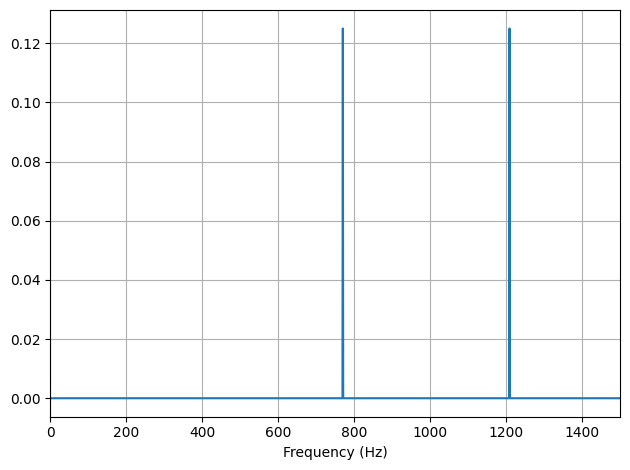

In [199]:
from scipy import fftpack

# Sampling frequencies
sr = 16000

# DFT length
N = len(t)

# Compute DFT using FFT
X = fftpack.fft(s_mix, n=N)

# Plot DFT
# fftfreq (window_length, sample spacing) -> sampling frequencies
# If we pass 1/sr as sample spacing the returned sampling frequencies will be in cycles/seconds (i.e. Hertz)
# If we pass 1 as sample spacing the returned sampling frequencies will be in cycles per unit, in this case we
# need to multiply by the sampling rate to get the same result i.e. the sampling frequencies in Hertz

# Calculate sampling frequencies
sampling_frequencies = fftpack.fftfreq(N, d=1/sr)

# Plot DFT
plt.plot(sampling_frequencies[:N//2], np.abs(X)[:N//2]/N)
plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()

(array([32.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 32.]),
 array([ 769.73821318,  813.70330761,  857.66840204,  901.63349647,
         945.59859089,  989.56368532, 1033.52877975, 1077.49387418,
        1121.4589686 , 1165.42406303, 1209.38915746]),
 <BarContainer object of 10 artists>)

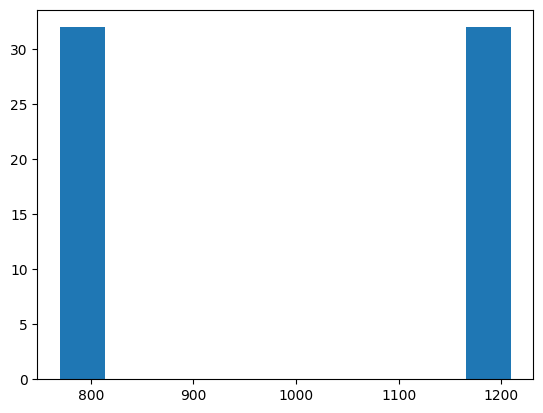

In [200]:
# Now let us do the same with librosa.piptrack
# Extract frequencies -> [n,t] where n is the number of FFT points divided by 2 and t is the number of time frames
frequencies, _ = librosa.piptrack(y=s_mix, sr=16000, n_fft=2048)

#print(frequencies)

# Take all the valid frequencies (i.e. that are not zero)
freqs=frequencies[frequencies>0].flatten()

# Plot histogram
plt.hist(freqs)

## **Student Activity**: Mystery DTMF Number

Utilise the audio processing libraries previously covered to analyze and decode the DTMF number from the provided audio file. Accomplish this by generating and examining its spectrogram.


In [201]:
f_dtmf = "./PL2_files/dtmfnumbers.wav"

# Play DTMF signal
ipd.Audio(filename = f_dtmf) # load a local WAV file

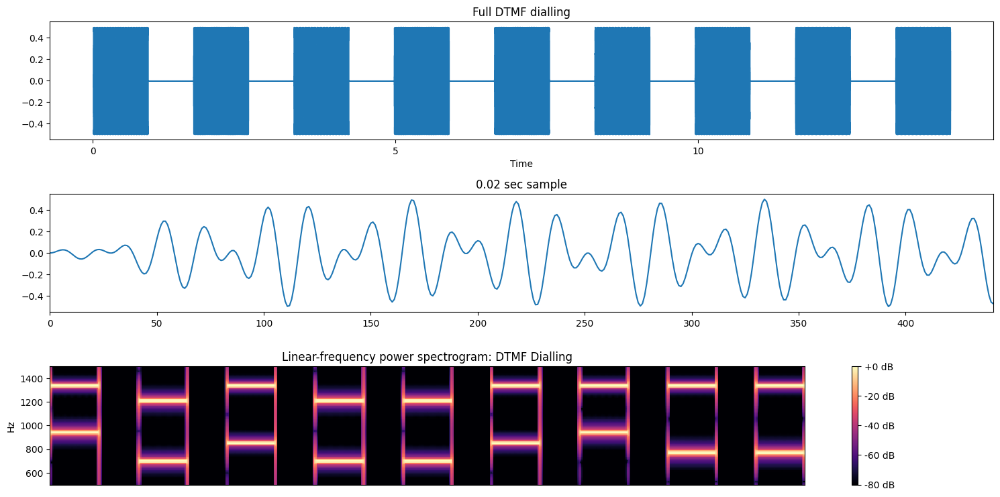

In [202]:
# Load audio file
y_dtmf, sr = librosa.load(f_dtmf)

# Create figure
plt.figure(figsize=(15, 10))

# Subplot 1 (plot waveform)
plt.subplot(4, 1, 1)
librosa.display.waveshow(y_dtmf, sr=sr)
plt.title('Full DTMF dialling')

# Subplot 2 (plot a subset of the samples)
plt.subplot(4, 1, 2)
plt.plot(y_dtmf)
plt.xlim((0, 0.02*sr))
plt.title('0.02 sec sample')

# Plot magnitude spectrogram
plt.subplot(4, 1, 3)
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(y_dtmf,n_fft=2048)),  ref=np.max)
librosa.display.specshow(D1, y_axis='linear')
plt.ylim((500,1500))
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram: DTMF Dialling')
plt.tight_layout()

# **Assignment**

Submit a notebook via brightspace demoing how to:

### **Question 1**
Create a function that takes a phone number as a string input, and generates a DTMF signal representing that phone number. Save the generated DTMF tones to a wav file.

# Solution

In [203]:
#imports

import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import urllib.request as urllib2
from scipy.io.wavfile import write
%matplotlib inline

Now, lets create a python dictionary representing frequencies of each keypress that we can use in our solution.

In [204]:
dtmf_mapping = {
    '1': (697, 1209), '2': (697, 1336), '3': (697, 1477), 'A': (697, 1633),
    '4': (770, 1209), '5': (770, 1336), '6': (770, 1477), 'B': (770, 1633),
    '7': (852, 1209), '8': (852, 1336), '9': (852, 1477), 'C': (852, 1633),
    '*': (941, 1209), '0': (941, 1336), '#': (941, 1477), 'D': (941, 1633)
}

Our dictionary is ready and we will use it in our solution.

For the Solution let's create a function that will take **phone number**, t_duration and Sampling frequency as parameters.

We will name this function **dtmf_signal_generate**.

In [205]:
# In this function we are setting a default time of each keypress will be 1 second and sampling frequency as 16kz
def dtmf_signal_generate(phone_number, t_duration=1, fs=16000):
    """
    This funtion generates a DTMF signal for a given phone number.

    Parameters:
      phone_number (str): The phone number as a string.
      t_duration (float): Duration (in seconds) of each tone.
      pause_time (float): Duration (in seconds) of silence between tones.
      fs (int): Sampling rate in Hz.

    Returns:
      np.array: The concatenated DTMF signal.
    """
    # Let's create an empty numpy array and name it dtmf_signal and also fix a pause time to 0.1 second.
    # This pause time is basically pause after each key press sound
    dtmf_signal = np.array([], dtype=np.float32)
    pause_time = 0.5

    # Create time values for our sound and the pause
    t = np.linspace(0, t_duration, int(fs * t_duration), endpoint=False)
    pause = np.zeros(int(fs * pause_time))

    # Now let's iterate over each character and see if it is matching in dictionary, once matched we will take
    # both the frequencies generate the signal and create a DTMF tone which will represent the sound of that key press.
    for digit in phone_number:
        digit = digit.upper()
        if digit in dtmf_mapping:
            f1, f2 = dtmf_mapping[digit]
            tone1 = np.sin(2 * np.pi * f1 * t)
            tone2 = np.sin(2 * np.pi * f2 * t)
            dtmf_tone = tone1 + tone2

            # Once we generate the signal of each character we concatenate the result along with the pause.
            dtmf_signal = np.concatenate((dtmf_signal, dtmf_tone, pause))
        else:
            print(f"Warning: '{digit}' is not a valid DTMF key. Skipping.")

    return dtmf_signal

# Finally we return the complete DTMF signal which will represent the complete sound of the numbers
# pressed on the keypad after each interval.

Our Function is ready now. Let's test it with some random numbers passed as arguments in function.

In [206]:
phone_number_1 = "1590"
sr = 16000
# Generate the DTMF signal
signal = dtmf_signal_generate(phone_number_1)
ipd.display(ipd.Audio(signal, rate=sr))

Great! This Example worked perfectly fine. Let's try another example with some lowercase a b c value and a value which is not in our dictionary see if our function is able to handle it or not.

In [207]:
phone_number_2 = "39331594acAk"

# Generate the DTMF signal
signal = dtmf_signal_generate(phone_number_2)
ipd.display(ipd.Audio(signal, rate=16000))

So our function correctly took the uppercase of ac and ignored k as there was no frequency we had for k in our dictionary. This shows our function is working insanely good and we can move forward with converting our generated audio into wavfile.

In [219]:
# To Save this generated dtmf signal into a wav file we first need to normalize it and convert it
# into int16 if we dont do this then file may get corrupted or will not play correctly on standard media players

signal_norm = librosa.util.normalize(signal)
signal_int16 = np.int16(signal_norm * 32767)

# Now we have our signal ready lets save the signal to a WAV file and keep sampling rate at 16Khz
fs = 16000
write("dtmf_tones.wav", fs, signal_int16)
print("DTMF tones saved to 'dtmf_tones.wav'")

DTMF tones saved to 'dtmf_tones.wav'


### **Question 2**

Create a function to decode DTMF audio into numbers. The function should process a dual-tone audio file input and return the numbers.

Demonstrate your function using example file dtmfnumber.wav to return the number.

# Solution

In [209]:
#imports

import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import urllib.request as urllib2
from scipy.io.wavfile import write
import scipy.signal
%matplotlib inline

Now, lets create a python dictionary representing frequencies of each keypress that we can use in our solution.

In [210]:
dtmf_mapping = {
    (697, 1209): '1', (697, 1336): '2', (697, 1477): '3', (697, 1633): 'A',
    (770, 1209): '4', (770, 1336): '5', (770, 1477): '6', (770, 1633): 'B',
    (852, 1209): '7', (852, 1336): '8', (852, 1477): '9', (852, 1633): 'C',
    (941, 1209): '*', (941, 1336): '0', (941, 1477): '#', (941, 1633): 'D'
}

Our dictionary is ready and we will use it in our solution.

Based on the matrix above lets define low and high frequencies in a separate array.

In [211]:
LOW_FREQS = [697, 770, 852, 941]
HIGH_FREQS = [1209, 1336, 1477, 1633]

So these were basically all our DTMF frequencies availabale. Now for solution let's create a closest match function which will take a frequency and finds the closest match from a list of known DTMF frequencies. We have also added a tolerance of 20Hz that will filter out frequencies which will be too far.

In [212]:
def closest_match(freq, freq_list, tolerance=20):
    """
    Find the closest matching frequency from a known DTMF set.
    Returns None if no match is within the given tolerance.
    """
    matches = [f for f in freq_list if abs(f - freq) <= tolerance]
    return min(matches, key=lambda x: abs(x - freq), default=None)

Great, Now lets create a function to extract the dtmf tone from the signal. The approach we will go with we will split our signal based on silences and for each non silent part we will find the frequencies in it. For both the frequency that will come we will check with dictionary and map the corresponding number with it.

In [213]:
def extract_dtmf_tones(signal, sample_rate, silence_threshold=1):
    """
    Parameters:
    - signal: Audio signal
    - sample_rate: Sample rate of the audio
    - silence_threshold: Amplitude threshold for detecting silence (default 20)

    Returns:
    - String representing the detected DTMF sequence.
    """
    detected_digits = []

    # Step 1: Split into non-silent segments using librosa split function
    non_silent_intervals = librosa.effects.split(signal, top_db=silence_threshold)

    for start, end in non_silent_intervals:
        segment = signal[start:end]

        # For each segment we will compute FFT using Librosa which will convert time domain
        # audio signal into frequency domain.
        stft_result = np.abs(librosa.stft(segment, n_fft=2048))
        freqs = librosa.fft_frequencies(sr=sample_rate, n_fft=2048)

        # Now STFT produces multiple frames over time, we take the mean along the time axis to get a single averaged spectrum.
        # It will help in identifying the dominant frequency components. Then find_peaks function detects frequency components
        # with amplitudes at least 50% of the highest peak in the spectrum
        spectrum = np.mean(stft_result, axis=1)
        peaks, _ = scipy.signal.find_peaks(spectrum, height=np.max(spectrum) * 0.5)
        detected_freqs = sorted([freqs[p] for p in peaks])

        # Once we have both of our detected frequencies we will iterate it through dictionary using closes_match function
        # to find the corresponding number.
        if len(detected_freqs) >= 2:
            low_freq = closest_match(detected_freqs[0], LOW_FREQS)
            high_freq = closest_match(detected_freqs[1], HIGH_FREQS)

            digit = dtmf_mapping.get((low_freq, high_freq))
            if digit:
                detected_digits.append(digit)

    return "".join(detected_digits)

Our function to find the dtmf number looks good, Let's create our final function where we will pass the wav file and it will give the result string of numbers.

In [214]:
def decode_dtmf(wav_file):
    signal, sample_rate = librosa.load(wav_file, sr=None)
    ipd.display(ipd.Audio(wav_file))
    return extract_dtmf_tones(signal, sample_rate)

Our decode_dtmf is our final function which will take the audio file path and will give us the resultant numbers along with play audio widget. Let's test it out.

In [215]:
decoded_number = decode_dtmf("./PL2_files/dtmfnumbers.wav")
print("Decoded Number:", decoded_number)

Decoded Number: 018118055


Our function works just as we expected! Wooohoooo.😀

Now Let's do some plotting which will help us in visulising the wav file.

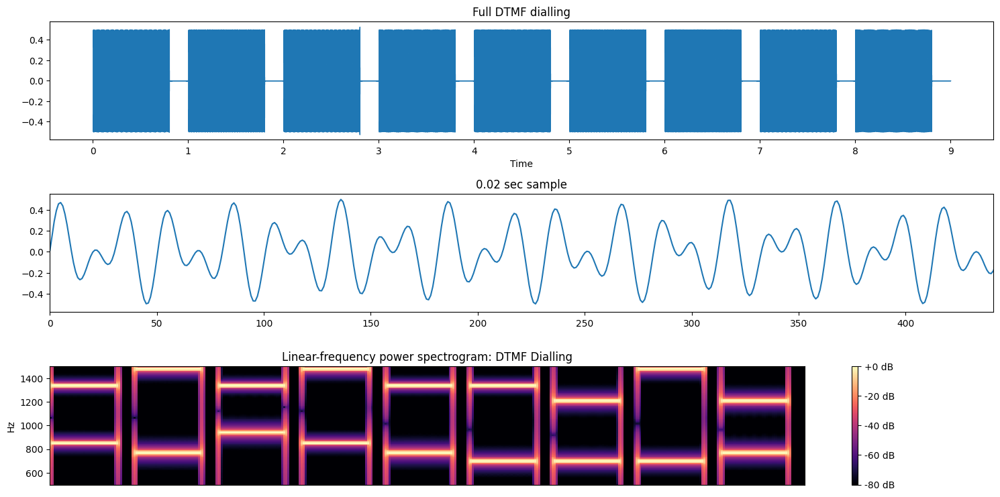

In [216]:
signal, sr = librosa.load("./PL2_files/dtmfnumbers_2.wav")

# Create figure
plt.figure(figsize=(15, 10))

# Subplot 1 (plot waveform)
plt.subplot(4, 1, 1)
librosa.display.waveshow(signal, sr=sr)
plt.title('Full DTMF dialling')

# Subplot 2 (plot a subset of the samples)
plt.subplot(4, 1, 2)
plt.plot(signal)
plt.xlim((0, 0.02*sr))
plt.title('0.02 sec sample')

# Plot magnitude spectrogram
plt.subplot(4, 1, 3)
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(signal,n_fft=2048)),  ref=np.max)
librosa.display.specshow(D1, y_axis='linear')
plt.ylim((500,1500))
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram: DTMF Dialling')
plt.tight_layout()

### **Question 3**
Make the algorithm robust to decode ten different example files (dtmfnumbers_1.wav to dtmfnumbers_10.wav) with different lengths of silences and different amplitudes of tones. Explain, how you did it.

# Solution

The Algorithm we used above is already robust enough to handle different lengths of silences and different amplitudes of tones. Let's test it out with all different files and see.

In [217]:
files = ["./PL2_files/dtmfnumbers.wav","./PL2_files/dtmfnumbers_1.wav","./PL2_files/dtmfnumbers_2.wav","./PL2_files/dtmfnumbers_3.wav","./PL2_files/dtmfnumbers_4.wav"
        ,"./PL2_files/dtmfnumbers_5.wav","./PL2_files/dtmfnumbers_6.wav","./PL2_files/dtmfnumbers_7.wav","./PL2_files/dtmfnumbers_8.wav","./PL2_files/dtmfnumbers_9.wav"
        ,"./PL2_files/dtmfnumbers_10.wav"]

Above I loaded all the file path and we will iterate over each of the wav file  and will call our extract dtmf tone function which we created above.

In [218]:
for file in files:
    print(file)
    decoded_number = decode_dtmf(file)
    print("Decoded Number:", decoded_number)
    print("-------------------------------------------")
    print("")

./PL2_files/dtmfnumbers.wav


Decoded Number: 018118055
-------------------------------------------

./PL2_files/dtmfnumbers_1.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_2.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_3.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_4.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_5.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_6.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_7.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_8.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_9.wav


Decoded Number: 860952134
-------------------------------------------

./PL2_files/dtmfnumbers_10.wav


Decoded Number: 860952134
-------------------------------------------



With the above output we can see our algorithim is able to identify all the files which we specified which has different length of silences and different amplitude tones.



---



But why did it work ???? 🤔

The Answer is really simple, Our algorithm works because it first splits the audio into chunks based on the amplitude thus our algorithm is robust enough to decode all ten example files (dtmfnumbers_1.wav to dtmfnumbers_10.wav). It uses the librosa split function to detect parts of the audio where the amplitude is very low (essentially silence). This means that no matter how long or short the silence is, as long as there's a clear drop to zero (or near zero), the function can accurately separate the audio into segments.

For each segment, we compute the Short-Time Fourier Transform (STFT) to extract its dominant frequency components. These frequencies are mapped to the corresponding DTMF digits, and finally, the digits are concatenated to form the complete sequence. 😃



**In Summary:**

The algorithm’s robustness comes from its reliance on detecting clear amplitude drops to define segments and dynamic frequency analysis. This design ensures that variations in the length of silences and the amplitudes of tones do not hinder the accurate decoding of the DTMF sequence.

# Thank you